In [3]:
import numpy as np 
import pickle
from matplotlib import pyplot as plt
from galpy.util import bovy_coords as coords
import os
import sys
from procedure import *

In [4]:
!hostname

pcn-5-14


In [ ]:
datapath="/mnt/home/bbhattarai/B3-N/"
freq_datapath="/mnt/home/bbhattarai/freq_data/"
plotpath="/mnt/home/bbhattarai/resonance_sweeping/New_Sims_Analysis/plots/"

In [ ]:
snapshot=700

In [ ]:
freq_datafile="DiskActions"+str(snapshot)+"_B3N.npy"

In [ ]:
freqs= np.load(freq_datapath+freq_datafile)

# Reading the values from the frequency data

In [ ]:
Jrdisk=freqs[0]
Jphidisk=freqs[1]
Jzdisk=freqs[2]
Trdisk=freqs[3]
Tphidisk=freqs[4]
Tzdisk=freqs[5]
Ordisk=freqs[6]
Ophidisk=freqs[7]
Ozdisk=freqs[8]
idd_from_freqs=freqs[9]

# Reading the snapshot data

In [ ]:
snapshot=700
snaparr = loadwholesnap(path,snapshot)
print("These are the data we have",snaparr[0].dtype)
idd=snaparr['idd']
x=snaparr['x']
y=snaparr['y']
z=snaparr['z']
vx=snaparr['vx']
vy=snaparr['vy']
vz=snaparr['vz']  
mass=snaparr['mass']  #mass is in solar mass (change old mass calculations to take account of the factor 2.324876e9)

vr=snaparr['vr']
vphi=snaparr['vphi']
vzz=snaparr['vzz']
r=snaparr['r']
phi=snaparr['phi'] #phi is in radians
zz=snaparr['zz']

#converting phi to degrees
phi_degrees=np.rad2deg(phi)

These are the data we have [('t', '<f8'), ('x', '<f4'), ('y', '<f4'), ('z', '<f4'), ('vx', '<f4'), ('vy', '<f4'), ('vz', '<f4'), ('vr', '<f4'), ('vphi', '<f4'), ('vzz', '<f4'), ('r', '<f4'), ('phi', '<f4'), ('zz', '<f4'), ('mass', '<f4'), ('idd', '<u8')]


# Making the cut

In [ ]:
discindx=(mass<1e-7*2.324876e9)
idd_snapshots=idd[discindx]
x_select=x[discindx]
y_select=y[discindx]
z_select=z[discindx]

vx_select=vx[discindx]
vy_select=vy[discindx]
vz_select=vz[discindx]


vr_select=vr[discindx]
vphi_select=vphi[discindx]
vzz_select=vzz[discindx]


r_select=r[discindx]
phi_select=phi_degrees[discindx]

In [ ]:
print("These are the ids obtained from the frequency data",len(idd_from_freqs))
print("These are the ids obtained from the snapshot  data",len(idd_snapshots))

These are the ids obtained from the frequency data 250980160
These are the ids obtained from the snapshot  data 250980160


# Loading all saved barangles

In [ ]:
angle_datapath="/mnt/home/bbhattarai/resonance_sweeping//New_Sims_Analysis/"
datafilename="0_to_1048_B3-N_fft_barangles_combined_degrees.ang"
ang_stored = open(angle_datapath+datafilename,'rb')
all_bangles=pickle.load(ang_stored)
print(len(all_bangles))

1048


# Checking resonance Conditions

In [ ]:
#datafilename="saved_bar_pattern_speed_km_per_s_kpc.ang"
datafilename="B3-N_saved_bar_pattern_speed_km_per_s_kpc.ang"
save_datapath="/mnt/home/bbhattarai/resonance_sweeping//New_Sims_Analysis/"
ps_stored = open(save_datapath+datafilename,'rb')
ps=pickle.load(ps_stored)
#print(ps)
ps_700=ps[700]
print(ps_700)

34.216967601166864


# Adjusting pattern_speed_value

In [ ]:
start=700-3
end=700+3
s=0
c=0
for i in range(start,end):
    c+=1
    s=s+ps[i]
print(c)
ps_adjusted=s/c

print(ps_adjusted)

#factor=3.08567758/3.15576
#ps_adjusted=ps_adjusted/factor
print(ps_adjusted)

6
34.205535280364714
34.205535280364714


# Calculating the Resonance Conditions

In [ ]:
#OLR resonance
#olr_resonance=Ophidisk-Ordisk/2 # inner Linbald resonance

olr_resonance=Ophidisk+Ordisk/2 # outer Linbald resonance
omega_diff_olr=olr_resonance-ps_adjusted
keep_olr=(omega_diff_olr<0.01)*(omega_diff_olr>-0.1)


#CR resonance
omega_diff=Ophidisk-ps_adjusted
keep_cr=(omega_diff<0.01)*(omega_diff>-0.1)

/cm/shared/sw/pkg/devel/python3/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in less
  

/cm/shared/sw/pkg/devel/python3/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in greater
  

/cm/shared/sw/pkg/devel/python3/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in less
  # This is added back by InteractiveShellApp.init_path()

/cm/shared/sw/pkg/devel/python3/3.7.3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in greater
  # This is added back by InteractiveShellApp.init_path()



# Entire Galactic Regions with Co-Rotating (CR) Resonance

In [ ]:
x_resonance_cr=(x_select[keep_cr])
y_resonance_cr=(y_select[keep_cr])
z_resonance_cr=(z_select[keep_cr])
vr_resonance_cr=(vr_select[keep_cr])
vphi_resonance_cr=(vphi_select[keep_cr])
vzz_resonance_cr=(vzz_select[keep_cr])

print(len(x_resonance_cr))

r_resonance_cr=r_select[keep_cr]
phi_resonance_cr=phi_select[keep_cr]

194590


# Calculating the percentage of stars that are in resonance with the bar:

In [ ]:
n_star=len(x_select)
n_star_cr=len(x_resonance_cr)

print(n_star)
print(n_star_cr)
percentage_cr=(n_star_cr/n_star)*100
print("The percentage of stars that are in Corotation Resonance is",percentage_cr)

250980160
194590
The percentage of stars that are in Corotation Resonance is 0.07753202484212297


# Entire Galactic Regions with OLR (Outer Linbald Resonance) Resonance

In [ ]:
x_resonance_olr=(x_select[keep_olr])
y_resonance_olr=(y_select[keep_olr])
z_resonance_olr=(z_select[keep_olr])
vr_resonance_olr=(vr_select[keep_olr])
vphi_resonance_olr=(vphi_select[keep_olr])
vzz_resonance_olr=(vzz_select[keep_olr])

r_resonance_olr=r_select[keep_olr]
phi_resonance_olr=phi_select[keep_olr]

n_star_olr=len(x_resonance_olr)
print(n_star_olr)
percentage_olr=(n_star_olr/n_star)*100
print("The percentage of stars that are in OLR are: ",percentage_olr)


737930
The percentage of stars that are in OLR are:  0.2940192563428121


# Selecting the slice -5<phi<5

In [ ]:
keep_phi_slice_cr=(phi_resonance_cr<5)*(phi_resonance_cr>-5)
keep_phi_slice_olr=(phi_resonance_olr<5)*(phi_resonance_olr>-5)

phi_slice_cr=phi_resonance_cr[keep_phi_slice_cr]
print(len(phi_slice_cr))

phi_slice_olr=phi_resonance_olr[keep_phi_slice_olr]
print(len(phi_slice_olr))

5352
24104


# Keeping record of values for the slice -5<phi<5

In [ ]:
keep_phi_slice=(phi_select<5)*(phi_select>-5)
x_select_phi_slice=x_select[keep_phi_slice]
y_select_phi_slice=y_select[keep_phi_slice]
z_select_phi_slice=z_select[keep_phi_slice]

vr_phi_slice=vr_select[keep_phi_slice]
vphi_phi_slice=vphi_select[keep_phi_slice]
vzz_phi_slice=vzz_select[keep_phi_slice]
r_phi_slice=r_select[keep_phi_slice]



# Keeping record of values in the Solar Neighborhood

In [ ]:
keep_sn=(x_select<8.5)*(x_select>7.5)*(y_select<0.5)*(y_select>-0.5)*(z_select<0.5)*(z_select>-0.5)
x_select_sn=x_select[keep_sn]
y_select_sn=y_select[keep_sn]
z_select_sn=z_select[keep_sn]

vr_sn=vr_select[keep_sn]
vphi_sn=vphi_select[keep_sn]
vzz_sn=vzz_select[keep_sn]
r_sn=r_select[keep_sn]

# Corotating Resonance (CR) in the slice

In [ ]:
x_resonance_cr_phi_slice=x_resonance_cr[keep_phi_slice_cr]
y_resonance_cr_phi_slice=(y_resonance_cr[keep_phi_slice_cr])
z_resonance_cr_phi_slice=(z_resonance_cr[keep_phi_slice_cr])
vr_resonance_cr_phi_slice=(vr_resonance_cr[keep_phi_slice_cr])
vphi_resonance_cr_phi_slice=(vphi_resonance_cr[keep_phi_slice_cr])
vzz_resonance_cr_phi_slice=(vzz_resonance_cr[keep_phi_slice_cr])

r_resonance_cr_phi_slice=r_resonance_cr[keep_phi_slice_cr]

phi_resonance_cr_phi_slice=phi_resonance_cr[keep_phi_slice_cr]

print(x_resonance_cr_phi_slice)

[3.6356766  4.4680176  4.659047   ... 0.16594635 0.5167156  0.20170446]


# OLR in the slice

In [ ]:
x_resonance_olr_phi_slice=x_resonance_olr[keep_phi_slice_olr]
y_resonance_olr_phi_slice=(y_resonance_olr[keep_phi_slice_olr])
z_resonance_olr_phi_slice=(z_resonance_olr[keep_phi_slice_olr])
vr_resonance_olr_phi_slice=(vr_resonance_olr[keep_phi_slice_olr])
vphi_resonance_olr_phi_slice=(vphi_resonance_olr[keep_phi_slice_olr])
vzz_resonance_olr_phi_slice=(vzz_resonance_olr[keep_phi_slice_olr])

r_resonance_olr_phi_slice=r_resonance_olr[keep_phi_slice_olr]

phi_resonance_olr_phi_slice=phi_resonance_olr[keep_phi_slice_olr]

print(x_resonance_olr_phi_slice)

[4.2777514  5.518349   5.521754   ... 0.557768   0.44406602 0.6548582 ]


# Selecting the solar neighboorhood

In [ ]:
keep_cr_sn=(x_resonance_cr<8.5)*(x_resonance_cr>7.5)*(y_resonance_cr<0.5)*(y_resonance_cr>-0.5)*(z_resonance_cr<0.5)*(z_resonance_cr>-0.5)
keep_olr_sn=(x_resonance_olr<8.5)*(x_resonance_olr>7.5)*(y_resonance_olr<0.5)*(y_resonance_olr>-0.5)*(z_resonance_olr<0.5)*(z_resonance_olr>-0.5)

#keep_cr_sn=(x_resonance_cr<8.5)*(x_resonance_cr>7.5)
#keep_olr_sn=(x_resonance_olr<8.5)*(x_resonance_olr>7.5)

# CR in the Solar Neighborhood

In [ ]:
x_resonance_cr_sr=x_resonance_cr[keep_cr_sn]
y_resonance_cr_sr=(y_resonance_cr[keep_cr_sn])
z_resonance_cr_sr=(z_resonance_cr[keep_cr_sn])
vr_resonance_cr_sr=(vr_resonance_cr[keep_cr_sn])
vphi_resonance_cr_sr=(vphi_resonance_cr[keep_cr_sn])
vzz_resonance_cr_sr=(vzz_resonance_cr[keep_cr_sn])

r_resonance_cr_sr=r_resonance_cr[keep_cr_sn]

phi_resonance_cr_sr=phi_resonance_cr[keep_cr_sn]

# OLR in the Solar Neighborhood

In [ ]:
x_resonance_olr_sr=(x_resonance_olr[keep_olr_sn])
y_resonance_olr_sr=(y_resonance_olr[keep_olr_sn])
z_resonance_olr_sr=(z_resonance_olr[keep_olr_sn])
vr_resonance_olr_sr=(vr_resonance_olr[keep_olr_sn])
vphi_resonance_olr_sr=(vphi_resonance_olr[keep_olr_sn])
vzz_resonance_olr_sr=(vzz_resonance_olr[keep_olr_sn])

r_resonance_olr_sr=r_resonance_olr[keep_olr_sn]
phi_resonance_olr_sr=phi_resonance_olr[keep_olr_sn]

# Printing resonance data

In [26]:
print("Ones with OLR resonance in the solar neighborhood: ",y_resonance_olr_sr)
print("Ones with CR resonance in the solar neighborhood: ",y_resonance_cr_sr)

Ones with OLR resonance in the solar neighborhood:  [-0.4767315  -0.48926395 -0.41576856 ... -0.29961327 -0.38168442
 -0.3654672 ]
Ones with CR resonance in the solar neighborhood:  [-0.3898509  -0.30201742 -0.45561197 -0.31176656 -0.40994775 -0.3876316
 -0.47330716 -0.31531408 -0.40923077 -0.47224006 -0.4153304  -0.4558683
 -0.38633263 -0.30813092 -0.2807244  -0.47835383 -0.47783205 -0.3416365
 -0.45079082  0.06671606 -0.21008748  0.12462071  0.1394269   0.21042842
  0.08250571  0.14882997  0.3474161   0.34134674  0.35254717  0.37033254
  0.08851692  0.08260311  0.3903062   0.27793857  0.23520254  0.33983722
 -0.02964663 -0.22795609 -0.17452659 -0.21524398 -0.11010899 -0.04187471
 -0.08348963 -0.04727112  0.07015097 -0.06898601 -0.21969526 -0.02527113
 -0.08724535  0.06528571 -0.00151505 -0.03103566 -0.13683276 -0.20017584
  0.0556811  -0.04830958  0.05469059 -0.10991418 -0.20817493 -0.09810542
 -0.06628791  0.0025634   0.19366199  0.2123674   0.09128143  0.13527271
  0.22393309  0.25

# Plotting x and y of resonance regions in the entire galaxy

In [27]:
fig4=plt.figure()
ax=fig4.add_subplot(111)
#ax.text(8,300,r"Snapshot %s, Slice: -5<$\phi$<5"%(str(snapshot)))
#cb1=ax.hexbin(x_select,y_select,extent=((-35,35,-35,35)),gridsize=500,mincnt=1,C=Ordisk,vmin=1,vmax=40)
cb1=ax.hexbin(x_select,y_select,extent=((-35,35,-35,35)),gridsize=500,mincnt=1,bins='log')
ax.scatter(x_resonance_cr,y_resonance_cr,c="black",marker=".",s=0.01,label="CR")
ax.scatter(x_resonance_olr,y_resonance_olr,c="red",marker=".",s=0.01,label="OLR")
ax.scatter(x_resonance_cr_sr,y_resonance_cr_sr,c="yellow",marker=".",s=0.1,label="CR-SN")
ax.scatter(x_resonance_olr_sr,y_resonance_olr_sr,c="orange",marker=".",s=0.1,label="OLR-SN")
ax.set_xlabel("x")
ax.set_ylabel("y")
ax.legend(bbox_to_anchor=(1.13,0.93), loc='center left',markerscale=9)
ax.text(13,30,r"Snapshot 700 (B3-N)")
#ax.set_xlim(7.5,8.5)
#ax.set_ylim(-0.5,0.5)
cbar_ax = fig4.add_axes([0.91, 0.12, 0.03, 0.76]) # position of the colorbar (left, bottom, width, height)
fig4.colorbar(cb1, cax=cbar_ax)
cbar_ax.set_ylabel(r'n$_{star}$')
cbar_ax.yaxis.label.set_size(10)
plotname=str(snapshot)+"B3-N_y_vs_x_with_resonance_regions_whole_galaxy.jpg"
fig4.savefig(plotpath+plotname,bbox_inches="tight",dpi=250)
print("Plot generated and saved to file: ",plotname)
plt.show()

Plot generated and saved to file:  700B3-N_y_vs_x_with_resonance_regions_whole_galaxy.jpg


In [28]:
print(np.max(vr_select))

590.5138


In [29]:
fig5=plt.figure()
ax=fig5.add_subplot(111)
#ax.text(8,300,r"Snapshot %s, Slice: -5<$\phi$<5"%(str(snapshot)))
#cb1=ax.hexbin(x_select,y_select,extent=((-35,35,-35,35)),gridsize=500,mincnt=1,C=Ordisk,vmin=1,vmax=40)
cb1=ax.hexbin(vr,vphi,extent=((-600,600,-600,600)),gridsize=500,mincnt=1,bins='log')
ax.set_xlabel("vR")
ax.set_ylabel(r"v$\phi$")
ax.scatter(vr_resonance_cr,vphi_resonance_cr,c="black",marker=".",s=0.01,label="CR")
ax.scatter(vr_resonance_olr,vphi_resonance_olr,c="red",marker=".",s=0.01,label="OLR")
ax.scatter(vr_resonance_cr_sr,vphi_resonance_cr_sr,c="yellow",marker=".",s=0.1,label="CR-SN")
ax.scatter(vr_resonance_olr_sr,vphi_resonance_olr_sr,c="orange",marker=".",s=0.1,label="OLR-SN")
ax.legend(bbox_to_anchor=(1.13,0.93), loc='center left',markerscale=9)
ax.text(248,550,r"Snapshot 700 (B3-N)")

cbar_ax = fig5.add_axes([0.91, 0.12, 0.03, 0.76]) # position of the colorbar (left, bottom, width, height)
fig5.colorbar(cb1, cax=cbar_ax)
cbar_ax.set_ylabel(r'n$_{star}$')
cbar_ax.yaxis.label.set_size(10)
plotname=str(snapshot)+"B3-N_v_phi_vs_vr_with_resonance_regions.jpg"
fig5.savefig(plotpath+plotname,bbox_inches="tight",dpi=200)
print("Plot generated and saved to file: ",plotname)
plt.show()

Plot generated and saved to file:  700B3-N_v_phi_vs_vr_with_resonance_regions.jpg


KeyboardInterrupt: 

Plot generated and saved to file:  700B3-N_v_phi_vs_vr_with_resonance_region_in_sn_slice.jpg


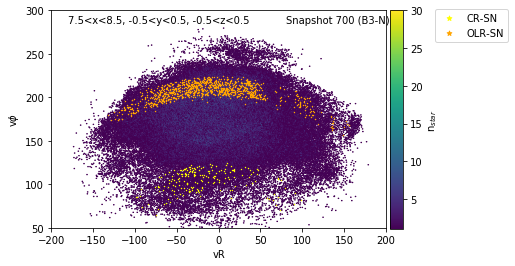

In [30]:
fig5_1=plt.figure()
ax=fig5_1.add_subplot(111)
#ax.text(8,300,r"Snapshot %s, Slice: -5<$\phi$<5"%(str(snapshot)))
#cb1=ax.hexbin(x_select,y_select,extent=((-35,35,-35,35)),gridsize=500,mincnt=1,C=Ordisk,vmin=1,vmax=40)
cb1=ax.hexbin(vr_sn,vphi_sn,extent=((-200,200,50,300)),gridsize=500,mincnt=1,vmin=1,vmax=30)
ax.set_xlabel("vR")
ax.set_ylabel(r"v$\phi$")
#ax.scatter(vr_resonance_cr,vphi_resonance_cr,c="black",marker=".",s=0.01,label="CR")
#ax.scatter(vr_resonance_olr,vphi_resonance_olr,c="red",marker=".",s=0.01,label="OLR")
ax.scatter(vr_resonance_cr_sr,vphi_resonance_cr_sr,c="yellow",marker="*",s=0.3,label="CR-SN")
ax.scatter(vr_resonance_olr_sr,vphi_resonance_olr_sr,c="orange",marker="*",s=0.3,label="OLR-SN")
ax.legend(bbox_to_anchor=(1.13,0.93), loc='center left',markerscale=9)
ax.text(80,285,r"Snapshot 700 (B3-N)")
ax.text(-180,285,r"7.5<x<8.5, -0.5<y<0.5, -0.5<z<0.5")

cbar_ax = fig5_1.add_axes([0.91, 0.12, 0.03, 0.76]) # position of the colorbar (left, bottom, width, height)
fig5_1.colorbar(cb1, cax=cbar_ax)
cbar_ax.set_ylabel(r'n$_{star}$')
cbar_ax.yaxis.label.set_size(10)
plotname=str(snapshot)+"B3-N_v_phi_vs_vr_with_resonance_region_in_sn_slice.jpg"
fig5_1.savefig(plotpath+plotname,bbox_inches="tight",dpi=300)
print("Plot generated and saved to file: ",plotname)
plt.show()

# Selecting a small angular region for analysis

In [31]:
keep_phi=(phi_select<5)*(phi_select>-5)
vphi_slice=vphi_select[keep_phi]

r_slice=r_select[keep_phi]

fig6=plt.figure()
ax=fig6.add_subplot(212)
ax1=fig6.add_subplot(211)
#ax.text(8,300,r"Snapshot %s, Slice: -5<$\phi$<5"%(str(snapshot)))
#cb1=ax.hexbin(x_select,y_select,extent=((-35,35,-35,35)),gridsize=500,mincnt=1,C=Ordisk,vmin=1,vmax=40)
cb1=ax.hexbin(r_slice,vphi_slice,extent=((5,15,50,300)),gridsize=500,mincnt=1,vmin=1,vmax=80)
ax.set_xlabel("R")
ax.set_ylabel(r"v$\phi$")
ax_cr=ax.scatter(r_resonance_cr_phi_slice,vphi_resonance_cr_phi_slice,c="black",marker=".",s=0.1,label="CR")
print(len(r_resonance_cr))
ax_olr=ax.scatter(r_resonance_olr_phi_slice,vphi_resonance_olr_phi_slice,c="red",marker=".",s=0.1,label="OLR")
ax.scatter(r_resonance_cr_sr,vphi_resonance_cr_sr,c="yellow",marker="*",s=0.1,label="CR-SN")
ax.scatter(r_resonance_olr_sr,vphi_resonance_olr_sr,c="orange",marker="*",s=0.1,label="OLR-SN")

cbar_ax = fig6.add_axes([0.91, 0.12, 0.03, 0.76]) # position of the colorbar (left, bottom, width, height)
fig6.colorbar(cb1, cax=cbar_ax)
cbar_ax.set_ylabel(r'n$_{star}$')
cbar_ax.yaxis.label.set_size(10)
ax.set_xlim(5,15)
ax.set_ylim(50,300)
#ax.legend(bbox_to_anchor=(0.77,0.93), loc='center left',markerscale=9)
ax.legend(bbox_to_anchor=(1.13,1.6), loc='center left',markerscale=9)

ax1.hexbin(r_slice,vphi_slice,extent=((5,15,50,300)),gridsize=500,mincnt=1,vmin=1,vmax=80)
ax1.set_xlim(5,15)
ax1.set_ylim(50,300)
ax1.text(12,270,r"Slice -5<$\phi$<5")
#ax.legend(markerscale=6)
plotname=str(snapshot)+"B3-N_v_phi_vs_r_with_resonance_regions.jpg"
fig6.savefig(plotpath+plotname,bbox_inches="tight",dpi=300)
print("Plot generated and saved to file: ",plotname)
plt.show()

194590
Plot generated and saved to file:  700B3-N_v_phi_vs_r_with_resonance_regions.jpg


In [107]:
print(r_resonance_cr_sr)

[7.96228941 7.96228941 7.96228941 7.96228941 7.60926252 7.60926252
 7.60926252 7.60926252 7.74319017 7.74319017 7.74319017 7.74319017]


# Loading new sims demo !!!!

In [41]:
from procedure import *

start at: 2021-07-28 07:58:25.962784
end at: 2021-07-28 07:58:25.963200


In [42]:
path

'../jhunt/scratch/Bonsai/r3/B3-N/'

In [43]:
snaparr = loadwholesnap(path,90)

In [47]:
print(snaparr[0].dtype)

[('t', '<f8'), ('idd', '<u8'), ('x', '<f4'), ('y', '<f4'), ('z', '<f4'), ('vx', '<f4'), ('vy', '<f4'), ('vz', '<f4'), ('vr', '<f4'), ('vphi', '<f4'), ('vzz', '<f4'), ('r', '<f4'), ('phi', '<f4'), ('zz', '<f4'), ('mass', '<f4')]


In [60]:
snaparr[(snaparr['x']>3)&(snaparr['y']<2)]['z']

array([-1.4168491, -1.4305626, -1.4188235, ...,  1.7226862,  1.797981 ,
        1.8907052], dtype=float32)

In [57]:
np.where(snaparr['idd']==241071075)[0]

array([97])